50k_15 images
     shear rate  eccentricity  convex_area  major_axis_length  \
0       50000.0      0.885317         37.0           9.430883   
1       50000.0      0.884789         74.0          13.252009   
2       50000.0      0.946915         32.0          10.777197   
3       50000.0      0.940209         52.0          13.127933   
4       50000.0      0.968245         32.0          11.823925   
5       50000.0      0.887130         30.0           8.655733   
6       50000.0      0.911907         89.0          15.410318   
7       50000.0      0.933837         78.0          15.702587   
8       50000.0      0.912931         73.0          14.339984   
9       50000.0      0.855443         51.0          10.880906   
10      50000.0      0.978112        109.0          23.684625   
11      50000.0      0.803529         45.0           9.565720   
12      50000.0      0.972659        104.0          22.202143   
13      50000.0      0.920996         36.0          10.666048   
14      500

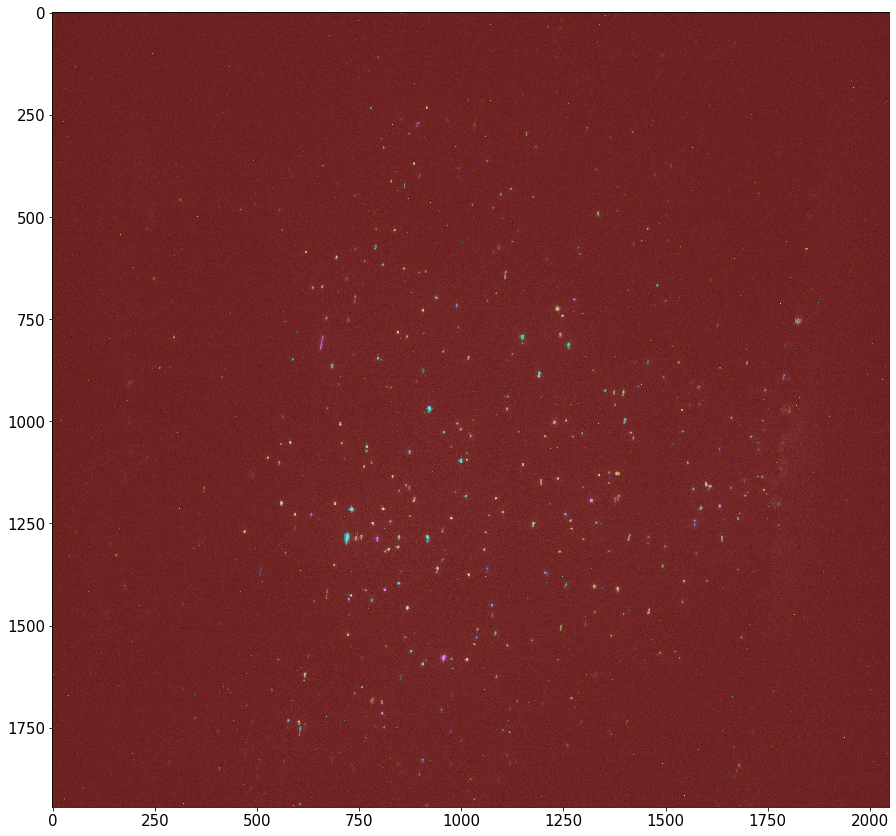

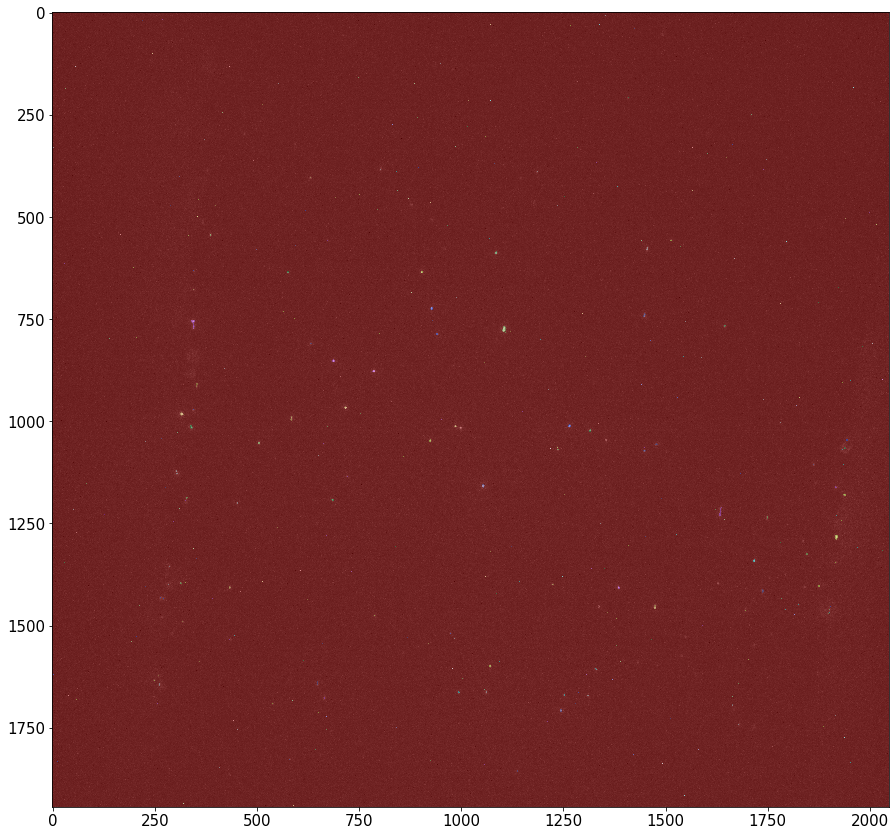

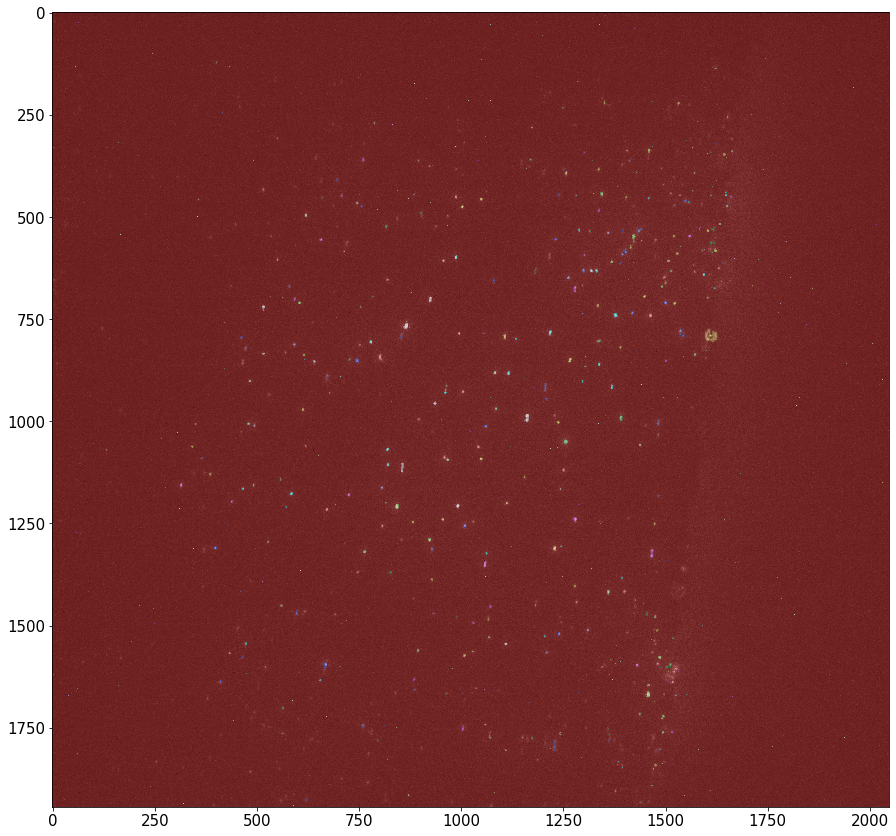

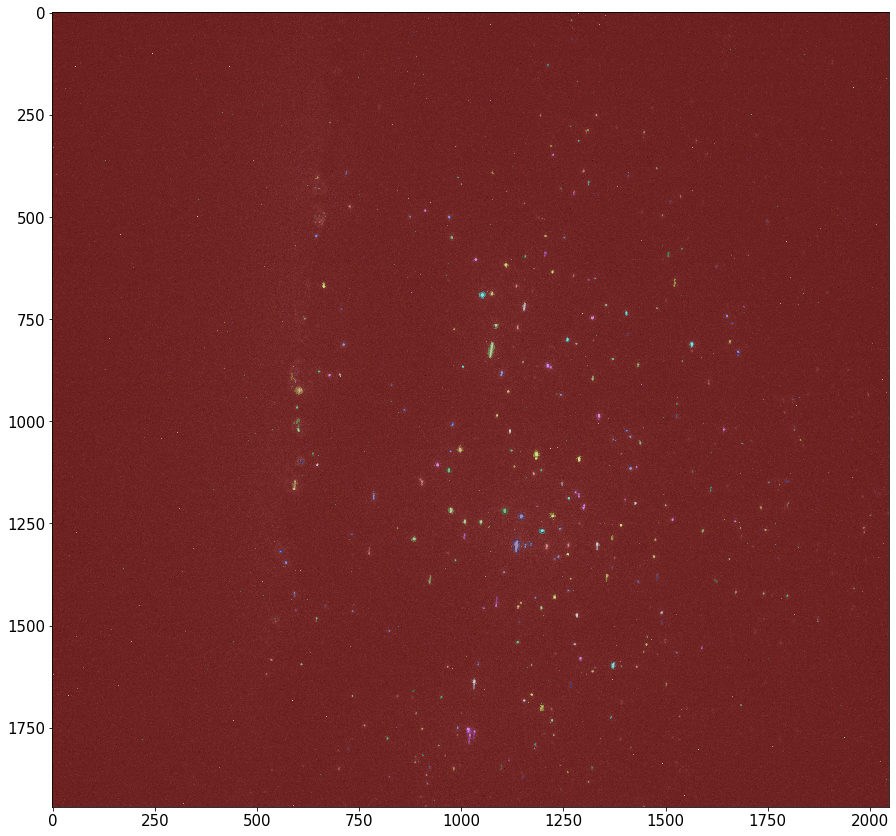

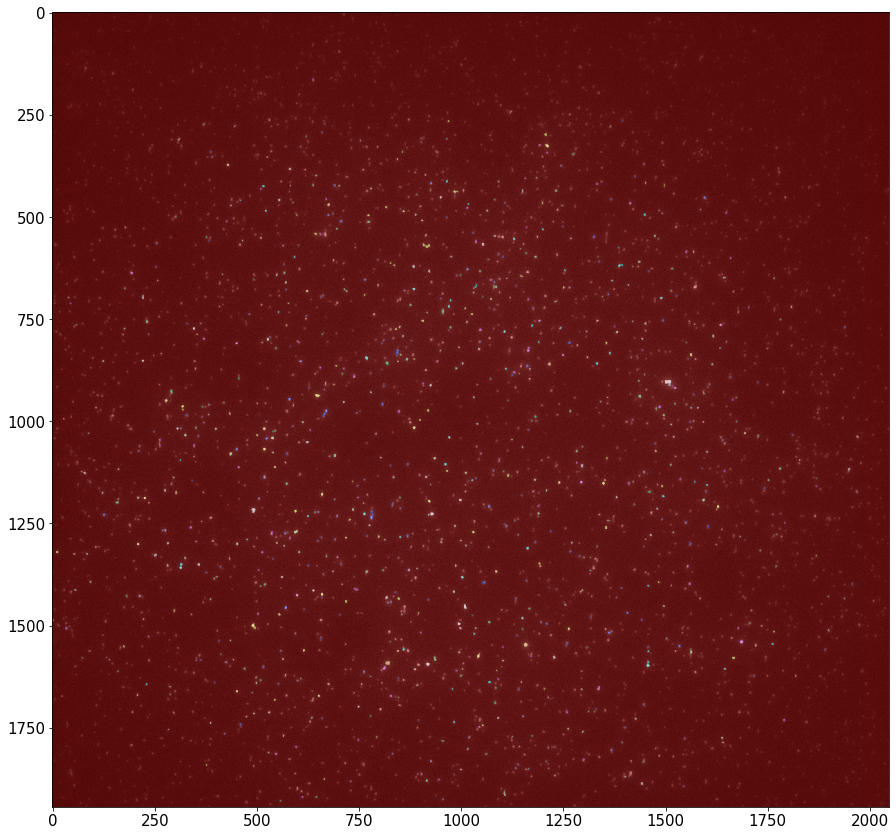

...

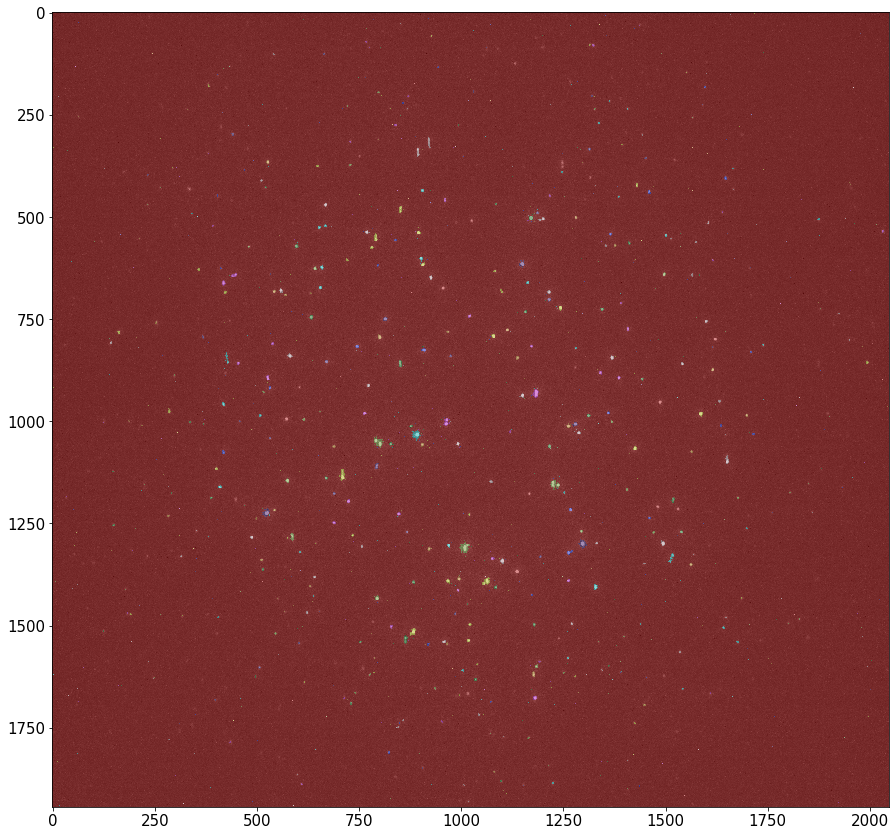

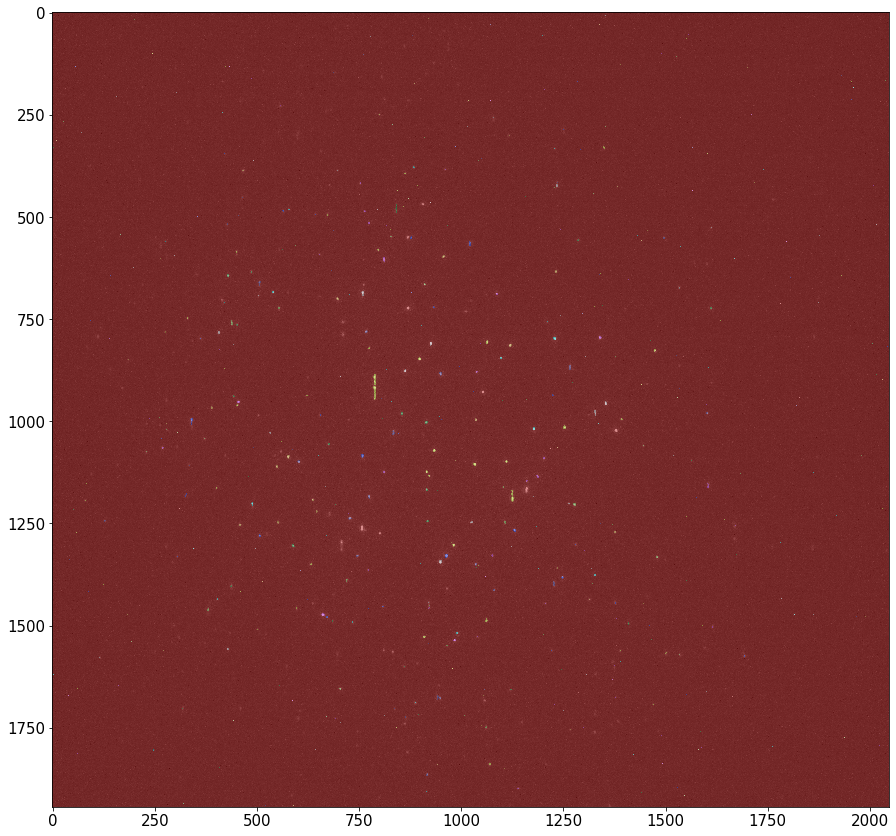

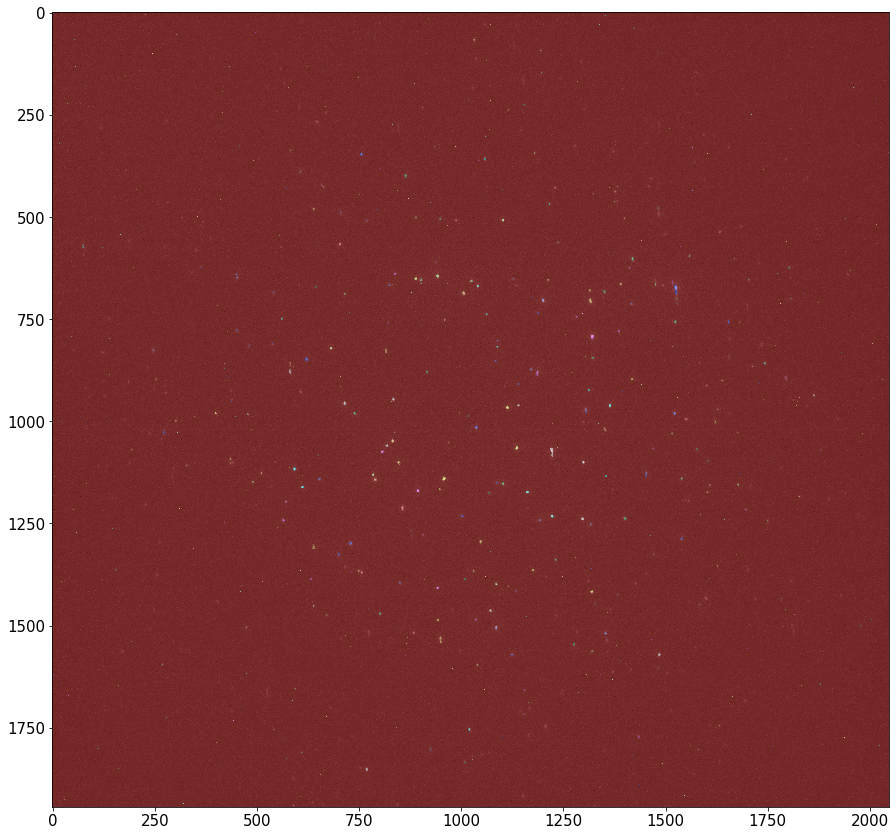

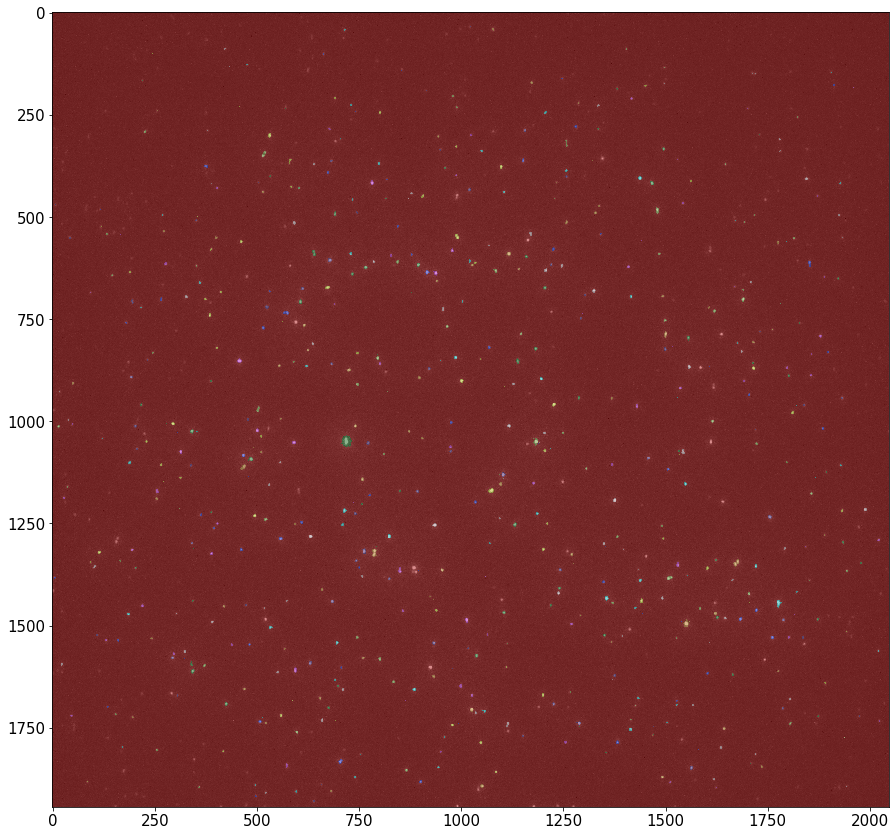

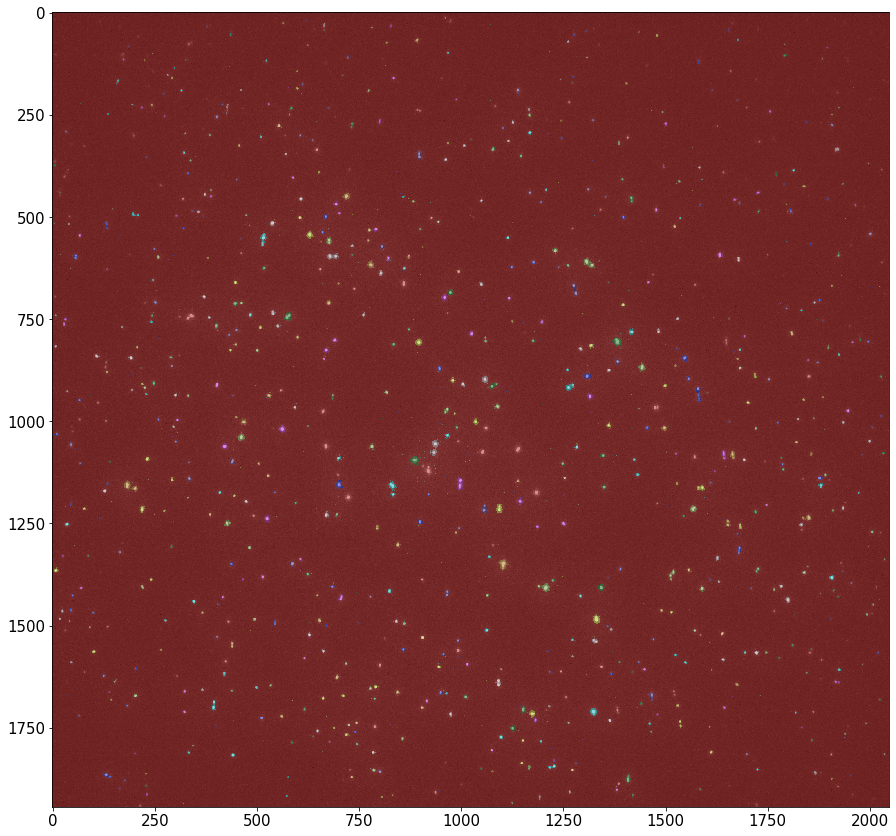

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
    
from PIL import Image
from pylab import *
from pathlib import Path
from skimage.color import rgb2gray
from skimage.measure import label, regionprops
from skimage.filters import threshold_yen
from skimage.morphology import closing, square
from skimage.segmentation import clear_border
from skimage.color import label2rgb
%matplotlib inline

shear_rate_50k = pd.DataFrame(columns=['shear rate', 'eccentricity', 'convex_area',
                                      'major_axis_length','minor_axis_length','orientation'])

# iterate over all images in a certain folder
pathlist = Path('Raw data_All images/50k_15 images/yen').glob('**/*.jpg')
for path in pathlist:
    path_in_str = str(path)
#    print(path_in_str)
    
    # open the image
    image = Image.open(path_in_str)
    
    # crop out the scale bar
    width, height = image.size
    left = 0
    top = 0
    right = width
    bottom = height-100
    im1 = image.crop((left, top, right, bottom)) 
#    im1.show()
        
    # apply threshold
    img_array = np.array(im1)
    image_gray = rgb2gray(img_array)
    image = image_gray
    thresh = threshold_yen(image)
    binary = image <= thresh
    bw = closing(image > thresh, square(3))
    plt.rcParams.update({'font.size': 15})
#    plt.figure(figsize = (15,15))
#    imshow(binary,cmap=plt.cm.gray)
    
    # remove artifacts connected to image border
    cleared = clear_border(bw)
    
    # label image regions
    label_image = label(cleared)
    image_label_overlay = label2rgb(label_image, image=image)
    fig, ax = plt.subplots(figsize=(15, 15))
    ax.imshow(image_label_overlay)
    
    # extract features
    props = regionprops(label_image,intensity_image=image_gray, coordinates='xy')

    for i in props: 
        # exclude circular(folded) and small(might be background noise) dots
        if i.eccentricity>.8 and i.convex_area>20:                                
            shear_rate_50k = shear_rate_50k.append({'shear rate': 50000, 'eccentricity': i.eccentricity, 
                                                    'convex_area': i.convex_area,'major_axis_length': i.major_axis_length,
                                                   'minor_axis_length': i.minor_axis_length,'orientation': i.orientation},
                                                   ignore_index=True)

print("50k_15 images", shear_rate_50k, sep='\n')

50k_15 images
     shear rate  eccentricity  convex_area  major_axis_length  \
0       50000.0      0.885317         37.0           9.430883   
1       50000.0      0.884789         74.0          13.252009   
2       50000.0      0.946915         32.0          10.777197   
3       50000.0      0.940209         52.0          13.127933   
4       50000.0      0.968245         32.0          11.823925   
5       50000.0      0.887130         30.0           8.655733   
6       50000.0      0.911907         89.0          15.410318   
7       50000.0      0.933837         78.0          15.702587   
8       50000.0      0.912931         73.0          14.339984   
9       50000.0      0.855443         51.0          10.880906   
10      50000.0      0.978112        109.0          23.684625   
11      50000.0      0.803529         45.0           9.565720   
12      50000.0      0.972659        104.0          22.202143   
13      50000.0      0.920996         36.0          10.666048   
14      500

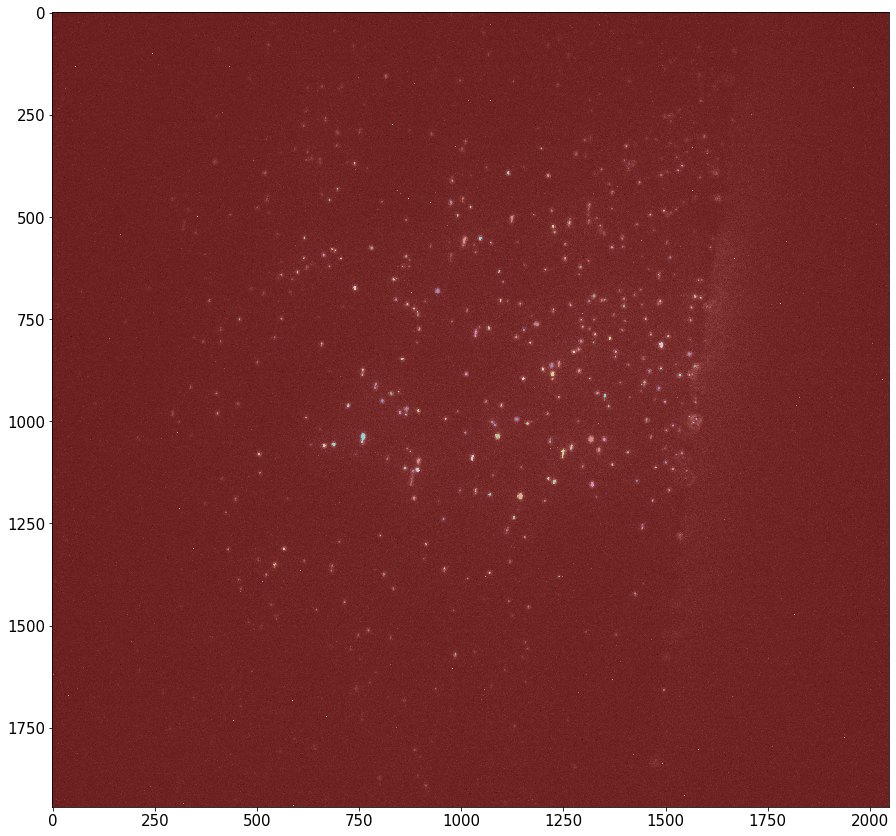

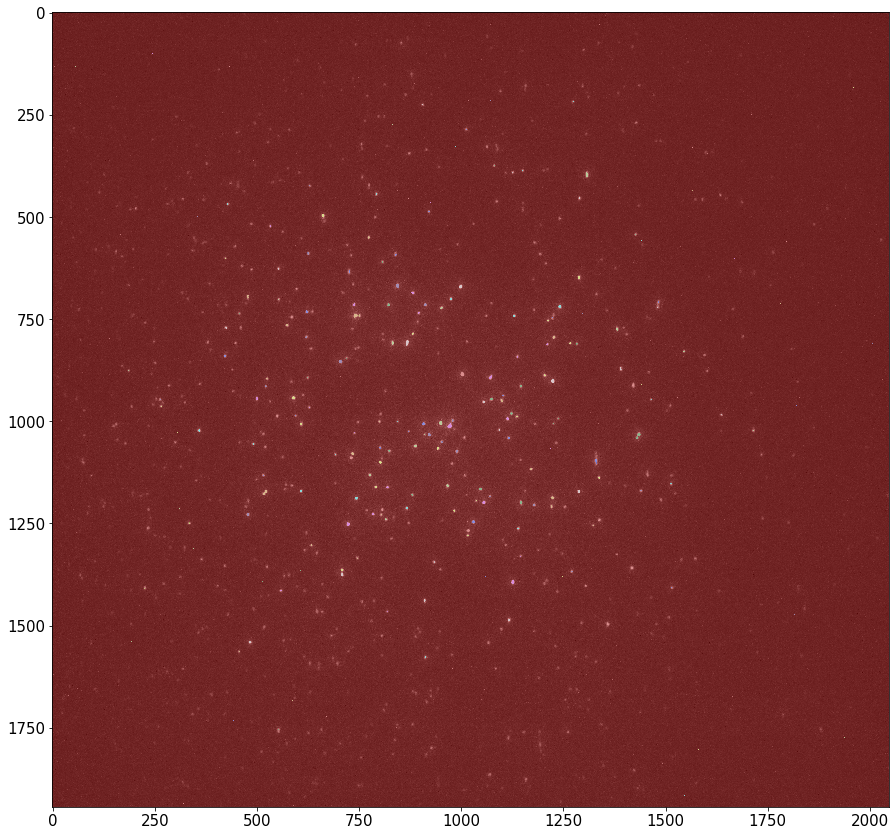

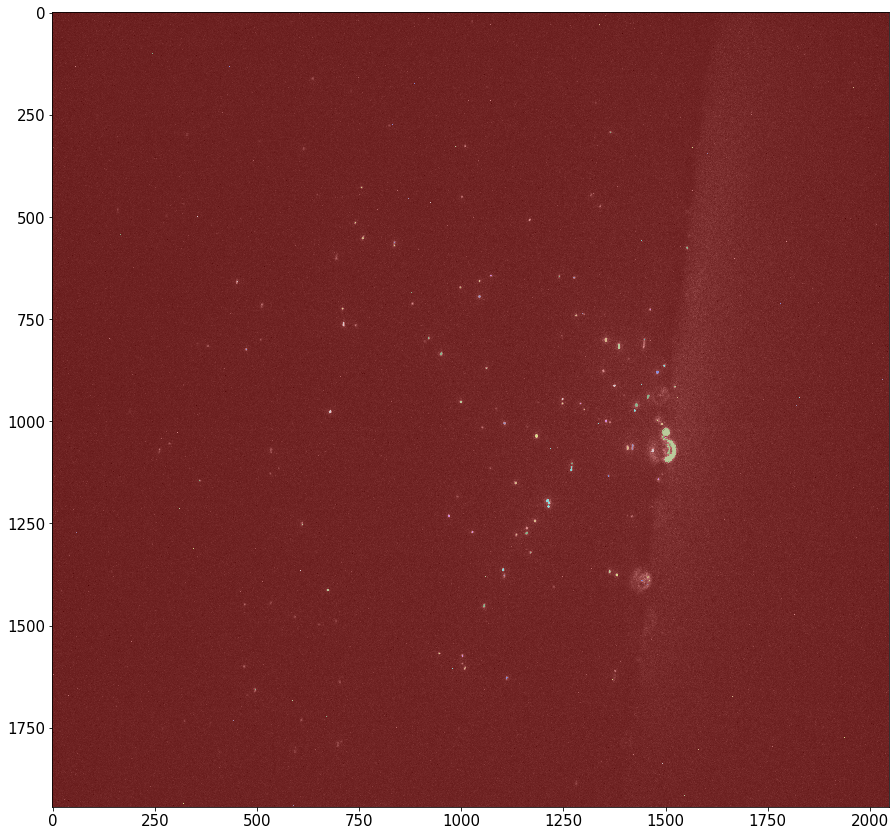

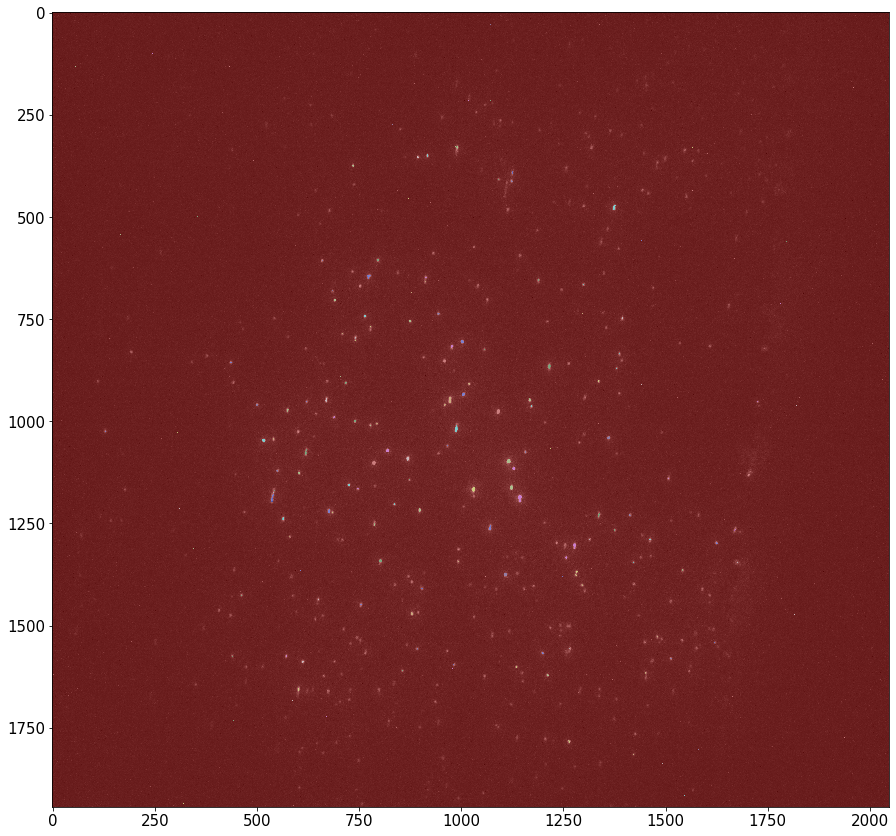

In [5]:
from skimage.filters import threshold_minimum

# iterate over all images in a certain folder
pathlist = Path('Raw data_All images/50k_15 images/minimum').glob('**/*.jpg')
for path in pathlist:
    path_in_str = str(path)
#    print(path_in_str)
    
    # open the image
    image = Image.open(path_in_str)
    
    # crop out scale bar
    width, height = image.size
    left = 0
    top = 0
    right = width
    bottom = height-100
    im1 = image.crop((left, top, right, bottom)) 
#    im1.show()
    
    # apply threshold
    img_array = np.array(im1)
    image_gray = rgb2gray(img_array)
    image = image_gray
    thresh = threshold_minimum(image)
    binary = image <= thresh
    bw = closing(image > thresh, square(3))
    plt.rcParams.update({'font.size': 15})
#    plt.figure(figsize = (15,15))
#    imshow(binary,cmap=plt.cm.gray)
    
    # remove artifacts connected to image border
    cleared = clear_border(bw)
    
    # label image regions
    label_image = label(cleared)
    image_label_overlay = label2rgb(label_image, image=image)
    fig, ax = plt.subplots(figsize=(15, 15))
    ax.imshow(image_label_overlay)
    
    # extract features
    props = regionprops(label_image,intensity_image=image_gray, coordinates='xy')
    
    for i in props: 
        # exclude circular(folded) and small(might be background noise) dots
        if i.eccentricity>.9 and i.convex_area>20:                                
            shear_rate_50k = shear_rate_50k.append({'shear rate': 50000, 'eccentricity': i.eccentricity, 
                                                    'convex_area': i.convex_area,'major_axis_length': i.major_axis_length,
                                                   'minor_axis_length': i.minor_axis_length,'orientation': i.orientation},
                                                   ignore_index=True)

print("50k_15 images", shear_rate_50k, sep='\n')

In [6]:
# save dataframe
shear_rate_50k.to_pickle('shear_rate_50k')
a = pd.read_pickle('shear_rate_50k')
print(a)

     shear rate  eccentricity  convex_area  major_axis_length  \
0       50000.0      0.885317         37.0           9.430883   
1       50000.0      0.884789         74.0          13.252009   
2       50000.0      0.946915         32.0          10.777197   
3       50000.0      0.940209         52.0          13.127933   
4       50000.0      0.968245         32.0          11.823925   
5       50000.0      0.887130         30.0           8.655733   
6       50000.0      0.911907         89.0          15.410318   
7       50000.0      0.933837         78.0          15.702587   
8       50000.0      0.912931         73.0          14.339984   
9       50000.0      0.855443         51.0          10.880906   
10      50000.0      0.978112        109.0          23.684625   
11      50000.0      0.803529         45.0           9.565720   
12      50000.0      0.972659        104.0          22.202143   
13      50000.0      0.920996         36.0          10.666048   
14      50000.0      0.81